# Look at bathymetry made using nemo_python

Github: https://github.com/knaughten/nemo_python/

In [1]:
import numpy as np
import xarray as xr
import sys  
sys.path.insert(0, '/home/users/birgal/')
from nemo_python import make_domain as md
from nemo_python import plots
import cartopy.crs as ccrs
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import cmocean

from shapely import geometry
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import pickle

In [2]:
import pyproj
from shapely.ops import transform
from multiprocessing import Process, Manager

#### Functions

In [3]:
def prepare_plot(figsize=(15, 15), dpi=300):
    """This function returns prepared axes for the polar plot.
    
    Usage:
        fig, ax = prepare_plot()
    """
    fig = plt.figure(figsize=figsize)
    ax = plt.axes(projection=ccrs.SouthPolarStereo())
    ax.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
    ax.set_boundary(map_circle, transform=ax.transAxes)
    # ax.coastlines(); 
    gl = ax.gridlines(draw_labels=True, ylocs=[]);#, color='w', lw=2);
    return fig, ax

In [4]:
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])

#### Visualize grid

In [6]:
gridT     = xr.open_dataset('/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/output/NEMO-test3-20230914/eANT025.L121_1m_19790101_19791231_grid_T.nc')
icemod    = xr.open_dataset('/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/output/NEMO-test3-20230914/eANT025.L121_1m_19790101_19791231_icemod.nc')
SBC       = xr.open_dataset('/gws/nopw/j04/terrafirma/birgal/NEMO_AIS/output/NEMO-test3-20230914/eANT025.L121_1m_19790101_19791231_SBC.nc')

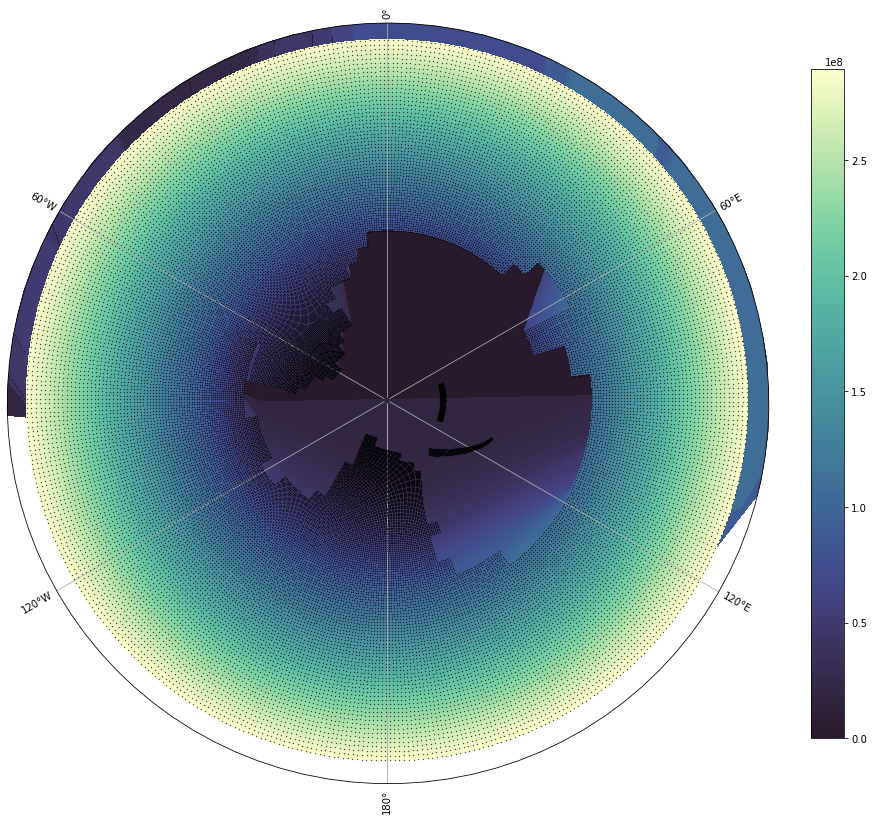

In [7]:
fig, ax = prepare_plot()
cm1 = ax.pcolormesh(gridT['nav_lon_grid_T'], gridT['nav_lat_grid_T'], gridT['area_grid_T'], 
                    transform=ccrs.PlateCarree(), cmap=cmocean.cm.deep_r);
cont1 = ax.scatter(gridT['nav_lon_grid_T'][::3,::3], 
                   gridT['nav_lat_grid_T'][::3,::3], 
                   zorder=3, transform=ccrs.PlateCarree(), s=0.1, c='k')

CB = fig.colorbar(cm1, ax=ax, fraction=0.04)

### Steps 1-2

Kaitlin has done steps 1-2, with the below output files:

In [5]:
bed   = xr.open_dataset('/gws/nopw/j04/terrafirma/kaight/input_data/topo/BedMachineAntarctica-v3.nc')
coord = xr.open_dataset('/home/users/birgal/data/bathymetry/coordinates_AIS.nc').squeeze()
BedMachine = xr.open_dataset('/home/users/birgal/data/bathymetry/eORCA025_BedMachine3_AIS.nc')
IBCSO      = xr.open_dataset('/home/users/birgal/data/bathymetry/topo/IBCSO_v2_bed_WGS84.nc')
Bed_IBCSO  = xr.open_dataset('/home/users/birgal/data/bathymetry/eORCA025_BedMachine3_IBCSO_AIS.nc')
# Bed_IBCSOt = xr.open_dataset('/home/users/birgal/data/bathymetry/eORCA025_BedMachine3_IBCSO_AIS_test.nc')

Visualize bathymetry in this step:

In [6]:
x1 = np.ma.masked_where(coord['nav_lon'][0:453,:] < 0, coord['nav_lon'][0:453,:])
y1 = np.ma.masked_where(coord['nav_lon'][0:453,:] < 0, coord['nav_lat'][0:453,:])
z1 = np.ma.masked_where(coord['nav_lon'][0:453,:] < 0, BedMachine['bathy'][0:453,:])

x2 = np.ma.masked_where(coord['nav_lon'][0:453,:] >= 0, coord['nav_lon'][0:453,:])
y2 = np.ma.masked_where(coord['nav_lon'][0:453,:] >= 0, coord['nav_lat'][0:453,:])
z2 = np.ma.masked_where(coord['nav_lon'][0:453,:] >= 0, BedMachine['bathy'][0:453,:])

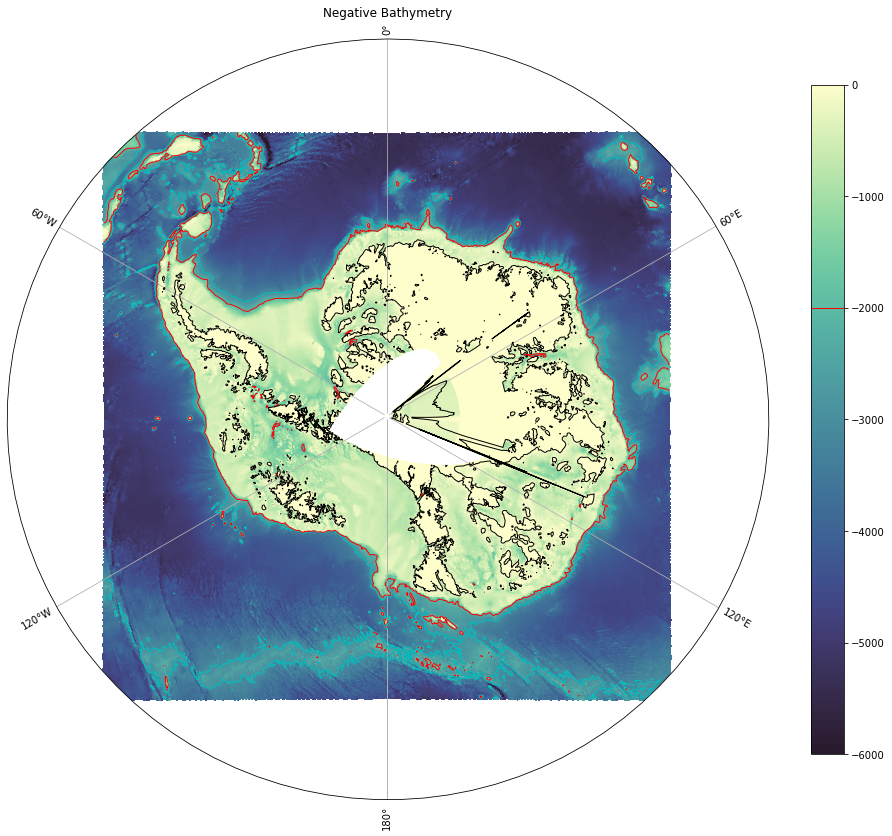

In [8]:
fig, ax = prepare_plot()
cm1 = ax.pcolormesh(coord['nav_lon'][0:453,:], 
                    coord['nav_lat'][0:453,:], 
                    BedMachine['bathy'], 
                    transform=ccrs.PlateCarree(), vmin=-6000, vmax=0, cmap=cmocean.cm.deep_r);

ax.set_title('Negative Bathymetry');
cont1 = ax.contour(x1, y1, z1, levels=[-3000], colors='c', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont2 = ax.contour(x2, y2, z2, levels=[-3000], colors='c', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont1 = ax.contour(x1, y1, z1, levels=[-2000], colors='r', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont2 = ax.contour(x2, y2, z2, levels=[-2000], colors='r', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont3 = ax.contour(x1, y1, z1, levels=[0], colors='k', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont4 = ax.contour(x2, y2, z2, levels=[0], colors='k', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())

CB = fig.colorbar(cm1, ax=ax, fraction=0.04)
CB.add_lines(cont1)

### Step 3

Options for combining the bathymetry from multiple underlying datasets (BedMachine, GEBCO, IBCSO):
- Fill Antarctic continent area with BedMachine, splice GEBCO or IBCSO into remainder of domain, and apply some sort of transition at edges
- Fill Antarctic continent area with BedMachine up until the 2000 m isobath, fill with GEBCO or IBCSO outside that with minimal transition at edges:
        - Variations: IBCSO v1 versus v2, or GEBCO (BedMachine uses IBCSOv1)
- Some other choice of isobath to separate at
- Use some sort of background weighting scheme that merges the different datasets (like those used by IBCSO and BedMachine)

What I need to be able to compare the bathymetry that results from these different methods:
- Files of BedMachine, GEBCO, IBCSO (v1 and v2) each interpolated over the NEMO domain
- Plus versions of bathymetry resulting from the options described above

BedMachine uses the minimum curvature algorithm to combine datasets, I think. Supplement. info: https://static-content.springer.com/esm/art%3A10.1038%2Fs41561-019-0510-8/MediaObjects/41561_2019_510_MOESM1_ESM.pdf
IBSCOv2 uses continuous curvature spline in tension. Background and high-quality grids are combined using the bending algorithm from Arndt et al. (https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/grl.50413)

##### Simple stack:

In [ ]:
x1 = np.ma.masked_where(coord['nav_lon'] < 0, coord['nav_lon'])
y1 = np.ma.masked_where(coord['nav_lon'] < 0, coord['nav_lat'])
z1 = np.ma.masked_where(coord['nav_lon'] < 0, Bed_IBCSO['bathy'])

x2 = np.ma.masked_where(coord['nav_lon'] >= 0, coord['nav_lon'])
y2 = np.ma.masked_where(coord['nav_lon'] >= 0, coord['nav_lat'])
z2 = np.ma.masked_where(coord['nav_lon'] >= 0, Bed_IBCSO['bathy'])

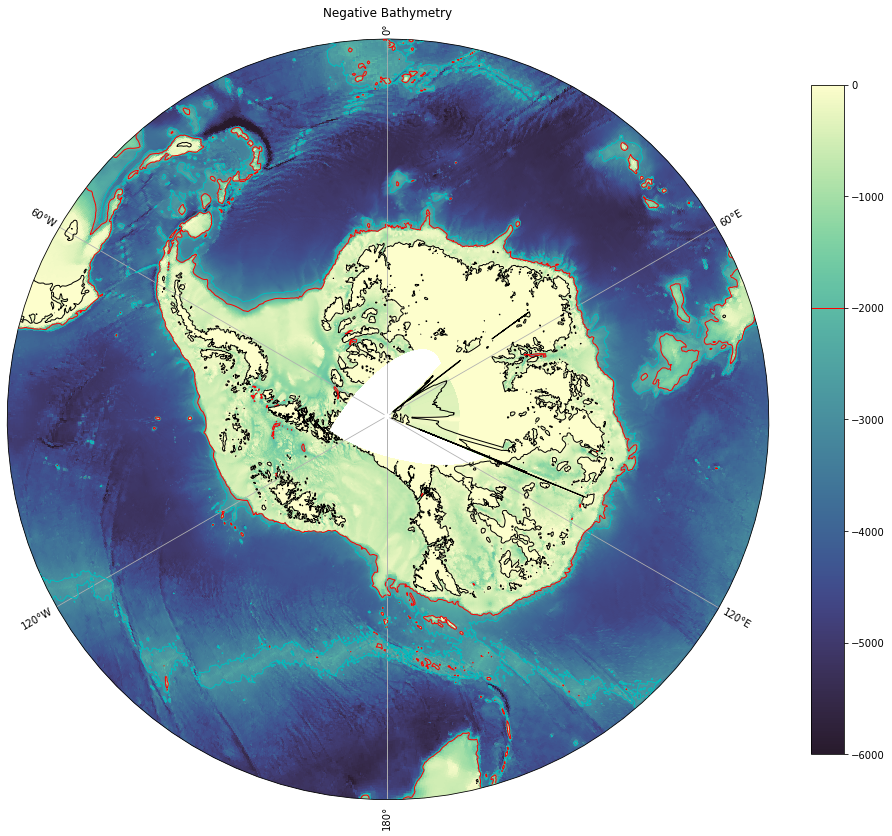

In [14]:
fig, ax = prepare_plot()
cm1 = ax.pcolormesh(coord['nav_lon'],coord['nav_lat'], Bed_IBCSO['bathy'], 
                    transform=ccrs.PlateCarree(), vmin=-6000, vmax=0, cmap=cmocean.cm.deep_r);

ax.set_title('Negative Bathymetry');
cont1 = ax.contour(x1, y1, z1, levels=[-3000], colors='c', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont2 = ax.contour(x2, y2, z2, levels=[-3000], colors='c', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont1 = ax.contour(x1, y1, z1, levels=[-2000], colors='r', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont2 = ax.contour(x2, y2, z2, levels=[-2000], colors='r', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont3 = ax.contour(x1, y1, z1, levels=[0], colors='k', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())
cont4 = ax.contour(x2, y2, z2, levels=[0], colors='k', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())

CB = fig.colorbar(cm1, ax=ax, fraction=0.04)
CB.add_lines(cont1)

In [16]:
# Load polygon from disc
with open('/home/users/birgal/data/IBCSO_isobath_2000m_polygon', "rb") as poly_file:
    isobath_2000m_polygon = pickle.load(poly_file)

x_iso, y_iso = isobath_2000m_polygon.exterior.xy
x_iso1 = np.ma.masked_where(np.array(x_iso) < 0, np.array(x_iso)) # need to separate longitudes because otherwise matplotlib plotting artifact
y_iso1 = np.ma.masked_where(np.array(x_iso) < 0, np.array(y_iso))
x_iso2 = np.ma.masked_where(np.array(x_iso) >= 0, np.array(x_iso))
y_iso2 = np.ma.masked_where(np.array(x_iso) >= 0, np.array(y_iso))

In [20]:
# compare side-by-side:

fig, ax = plt.subplots(1,3, figsize=(20,15), subplot_kw={'projection': ccrs.SouthPolarStereo()}, dpi=1000)

x, y = np.meshgrid(IBCSO['lon'], IBCSO['lat'])
for axis in ax.ravel():
    axis.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())
    axis.set_boundary(map_circle, transform=axis.transAxes)
    gl = axis.gridlines(draw_labels=True, ylocs=[]);
    # add 2000 m isobath contour to each of the plots 
    axis.plot(x_iso1, y_iso1, c='k', zorder=4, linewidth=1.2, transform=ccrs.PlateCarree())
    axis.plot(x_iso2, y_iso2, c='k', zorder=4, linewidth=1.2, transform=ccrs.PlateCarree())

ax[0].set_title('BedMachine bathymetry interpolated to NEMO')
ax[1].set_title('BedMachine bathymetry combined with IBCSO')
ax[2].set_title('Combined bathymetry minus BedMachine bathy')

# Separated bathymetries:
kwags={'transform':ccrs.PlateCarree(), 'vmin':-6000, 'vmax':0, 'cmap':cmocean.cm.deep_r, 'rasterized':True}
cm1 = ax[0].pcolormesh(coord['nav_lon'][0:453,:],coord['nav_lat'][0:453,:], BedMachine['bathy'], **kwags);
cm2 = ax[1].pcolormesh(coord['nav_lon'][0:453,:],coord['nav_lat'][0:453,:], Bed_IBCSO['bathy'], **kwags);

# Difference between the bathymetries:
BedMachine_reshaped          = np.zeros(Bed_IBCSO['bathy'].values.shape)
BedMachine_reshaped[0:453,:] = BedMachine['bathy'].values
BedMachine_plot = xr.where(np.isnan(BedMachine['bathy']), 0, BedMachine['bathy'])
Bed_IBCSO_plot  = xr.where(np.isnan(Bed_IBCSO['bathy']), 0, Bed_IBCSO['bathy'])
Bed_IBCSO_plott = xr.where(np.isnan(Bed_IBCSOt['bathy']), 0, Bed_IBCSOt['bathy'])
# cm3 = ax[2].pcolormesh(coord['nav_lon'], coord['nav_lat'], Bed_IBCSO_plot - BedMachine_reshaped, 
#                        cmap=cmocean.cm.balance, transform=ccrs.PlateCarree(), vmin=-2, vmax=2, rasterized=True);
cm3 = ax[2].pcolormesh(coord['nav_lon'][0:453,:], coord['nav_lat'][0:453,:], 
                       (Bed_IBCSO_plott - BedMachine_plot), 
                       cmap=cmocean.cm.balance, transform=ccrs.PlateCarree(), vmin=-2, vmax=2, rasterized=True);

CB = fig.colorbar(cm3, ax=ax[2], fraction=0.04)
fig.set_facecolor('white')
# fig.savefig('/home/users/birgal/data/input_data/topo/BedMachine_IBCSOv2_combined_NEMO.pdf', format='pdf')

##### Polygon:

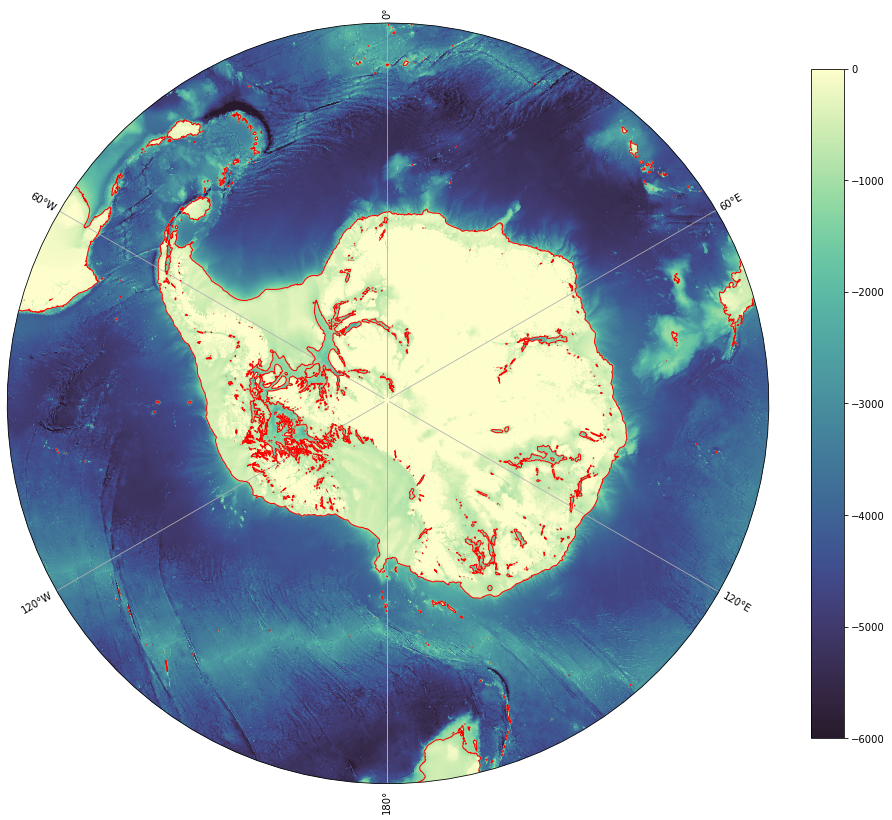

In [6]:
fig, ax = prepare_plot()
cm1 = ax.pcolormesh(IBCSO['lon'][::10], 
                    IBCSO['lat'][::5],
                    IBCSO['z'][::5,::10], 
                    transform=ccrs.PlateCarree(), vmin=-6000, vmax=0, cmap=cmocean.cm.deep_r);

x, y = np.meshgrid(IBCSO['lon'], IBCSO['lat'])
cs  = ax.contour(x, y, IBCSO['z'], levels=[-1000], colors='r', linestyles='-', linewidths=1, zorder=4, transform=ccrs.PlateCarree())

CB = fig.colorbar(cm1, ax=ax, fraction=0.04)
# CB.add_lines(cont1)

##### Make polygon of 2000 m isobath to separate domain:

In [7]:
# # Create largest polygon based on 2000 m contour line (excluding holes)
# for ncp, cp in enumerate(cs.collections[0].get_paths()[0].to_polygons()):
#     isobath_2000m = geometry.Polygon([(i[0], i[1]) for i in zip(cp[:,0],cp[:,1])])

# Create largest polygon based on 1000 m contour line (excluding holes)
for ncp, cp in enumerate(cs.collections[0].get_paths()[0].to_polygons()):
    isobath_1000m = geometry.Polygon([(i[0], i[1]) for i in zip(cp[:,0],cp[:,1])])

In [8]:
x_iso, y_iso = isobath_1000m.exterior.xy
x_iso1 = np.ma.masked_where(np.array(x_iso) < 0, np.array(x_iso))
y_iso1 = np.ma.masked_where(np.array(x_iso) < 0, np.array(y_iso))
x_iso2 = np.ma.masked_where(np.array(x_iso) >= 0, np.array(x_iso))
y_iso2 = np.ma.masked_where(np.array(x_iso) >= 0, np.array(y_iso))

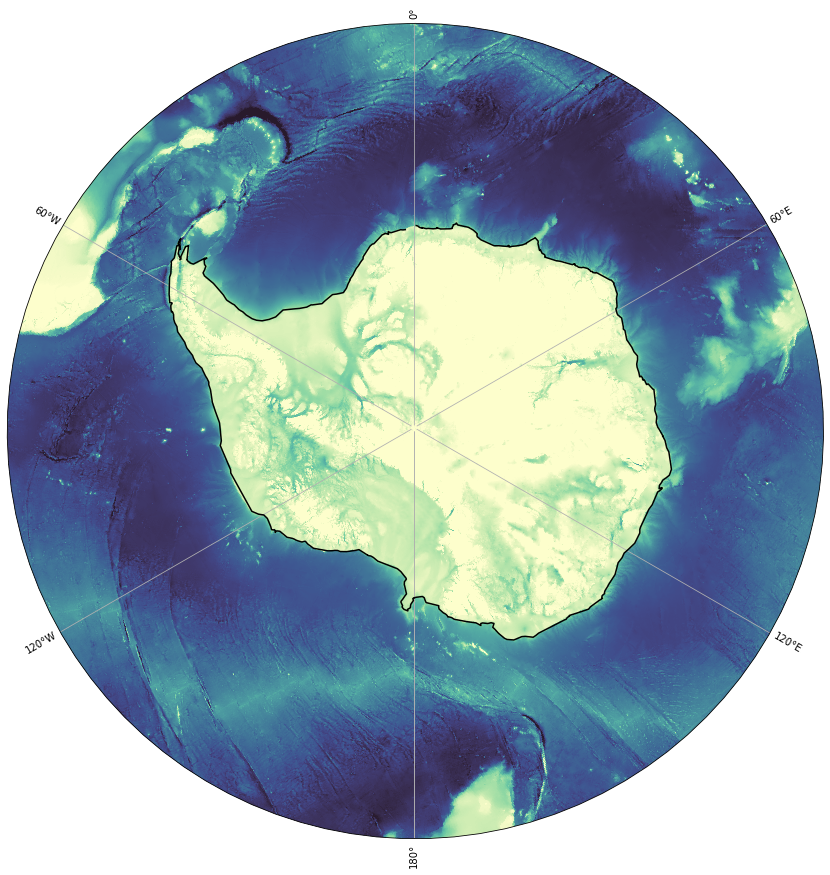

In [9]:
fig, ax = prepare_plot()
cm1 = ax.pcolormesh(IBCSO['lon'][::10], 
                    IBCSO['lat'][::5],
                    IBCSO['z'][::5,::10], 
                    transform=ccrs.PlateCarree(), vmin=-6000, vmax=0, cmap=cmocean.cm.deep_r);

ax.plot(x_iso1, y_iso1, c='k', zorder=4, transform=ccrs.PlateCarree())
ax.plot(x_iso2, y_iso2, c='k', zorder=4, transform=ccrs.PlateCarree())

# CB = fig.colorbar(cm1, ax=ax, fraction=0.04)
# CB.add_lines(cont1)

In [10]:
# Save polygon to disc
with open('/home/users/birgal/data/IBCSO_isobath_1000m_polygon', "wb") as poly_file:
    pickle.dump(isobath_1000m, poly_file, pickle.HIGHEST_PROTOCOL)